<a href="https://colab.research.google.com/github/charliashby/MI3-Project-2/blob/main/DS4002_Proj2_TimeSeries.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Import Packages

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm

#Import Data

In [ ]:
#if running on Google Colab, run this cell to mount to Drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#modify filepaths to match where they are stored on YOUR local machine or Google Drive

econ_filepath = '/content/drive/MyDrive/DS4002/Project 2/MI2/gdp_pcap_world_bank.csv'
life_expect_filepath = '/content/drive/MyDrive/DS4002/Project 2/MI2/life_expectancy.csv'

In [ ]:
#read GDP dataset
econ_df = pd.read_csv(econ_filepath)

econ_df = econ_df.rename(columns={'World Bank Classification ': 'WB_class'})

econ_df.head(10)

,country,WB_class,1800,1801,1802,1803,1804,1805,1806,1807,...,2091,2092,2093,2094,2095,2096,2097,2098,2099,2100
0,Afghanistan,LI,477,477,477,477,477,477,477,477,...,4820,4930,5040,5160,5280,5410,5540,5670,5800,5940
1,Angola,LMI,370,371,373,375,376,378,380,382,...,24.9k,25.4k,25.9k,26.4k,26.9k,27.5k,28k,28.6k,29.1k,29.7k
2,Albania,UMI,466,467,468,470,471,472,474,475,...,54.1k,54.7k,55.3k,55.9k,56.5k,57k,57.6k,58.2k,58.8k,59.3k
3,Andorra,HI,1360,1360,1360,1370,1370,1370,1370,1380,...,79.3k,79.6k,79.9k,80.2k,80.5k,80.8k,81k,81.3k,81.6k,81.8k
4,UAE,NaN,1130,1140,1140,1150,1150,1150,1160,1160,...,92.5k,92.6k,92.7k,92.8k,92.8k,92.9k,93k,93k,93.1k,93.2k
5,Argentina,UMI,1690,1690,1700,1700,1710,1710,1720,1730,...,59.7k,60.3k,60.8k,61.4k,61.9k,62.5k,63k,63.5k,64k,64.6k
6,Armenia,UMI,584,585,587,588,590,592,593,595,...,57.5k,58k,58.6k,59.2k,59.7k,60.3k,60.8k,61.4k,61.9k,62.5k
7,Antigua and Barbuda,HI,860,860,860,860,860,860,860,861,...,61.1k,61.7k,62.2k,62.7k,63.3k,63.8k,64.3k,64.8k,65.4k,65.9k
8,Australia,HI,814,819,823,828,833,838,842,847,...,80.9k,81.2k,81.5k,81.7k,82k,82.3k,82.5k,82.8k,83k,83.3k
9,Austria,HI,1930,1940,1940,1950,1960,1970,1970,1980,...,83k,83.2k,83.5k,83.7k,83.9k,84.1k,84.3k,84.5k,84.7k,84.9k


In [ ]:
#read life expectancy dataset
life_expect_df = pd.read_csv(life_expect_filepath)

life_expect_df.head(10)

,country,1800,1801,1802,1803,1804,1805,1806,1807,1808,...,2091,2092,2093,2094,2095,2096,2097,2098,2099,2100
0,Afghanistan,28.2,28.2,28.2,28.2,28.2,28.2,28.1,28.1,28.1,...,75.9,76.1,76.2,76.4,76.5,76.7,76.8,77.0,77.1,77.3
1,Angola,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,...,75.8,75.9,76.0,76.1,76.3,76.4,76.5,76.7,76.8,76.9
2,Albania,35.4,35.4,35.4,35.4,35.4,35.4,35.4,35.4,35.4,...,88.9,89.0,89.2,89.3,89.4,89.5,89.6,89.7,89.8,90.0
3,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,91.0,91.1,91.3,91.4,91.5,91.6,91.7,91.8,91.9,92.0
4,UAE,30.7,30.7,30.7,30.7,30.7,30.7,30.7,30.7,30.7,...,83.7,83.8,83.9,84.0,84.1,84.2,84.3,84.5,84.6,84.7
5,Argentina,33.2,33.2,33.2,33.2,33.2,33.2,33.2,33.2,33.2,...,86.8,86.9,87.0,87.2,87.3,87.4,87.5,87.6,87.7,87.8
6,Armenia,34.0,34.0,34.0,34.0,34.0,34.0,34.0,34.0,34.0,...,86.0,86.1,86.2,86.3,86.4,86.5,86.7,86.8,86.9,87.0
7,Antigua and Barbuda,33.5,33.5,33.5,33.5,33.5,33.5,33.5,33.5,33.5,...,86.2,86.3,86.4,86.5,86.7,86.8,86.9,87.0,87.1,87.2
8,Australia,34.0,34.0,34.0,34.0,34.0,34.0,34.0,34.0,34.0,...,91.6,91.7,91.8,91.9,92.0,92.2,92.3,92.4,92.5,92.6
9,Austria,34.4,34.4,34.4,34.4,34.4,34.4,34.4,34.4,34.4,...,91.5,91.6,91.7,91.8,91.9,92.1,92.2,92.3,92.4,92.5


In [ ]:
#create world bank class df from econ_df

wb_class_df = econ_df[['country', 'WB_class']]

wb_class_df.head(10)

,country,WB_class
0,Afghanistan,LI
1,Angola,LMI
2,Albania,UMI
3,Andorra,HI
4,UAE,NaN
5,Argentina,UMI
6,Armenia,UMI
7,Antigua and Barbuda,HI
8,Australia,HI
9,Austria,HI


#EDA

In [ ]:
print(econ_df.columns)

Index(['country', 'WB_class', '1800', '1801', '1802', '1803', '1804', '1805',
       '1806', '1807',
       ...
       '2091', '2092', '2093', '2094', '2095', '2096', '2097', '2098', '2099',
       '2100'],
      dtype='object', length=303)


In [ ]:
#how many countries of each development class?

worldbank_counts = econ_df['WB_class'].value_counts(dropna=False)

print(worldbank_counts)

WB_class
HI     62
UMI    54
LMI    50
LI     26
NaN     3
Name: count, dtype: int64


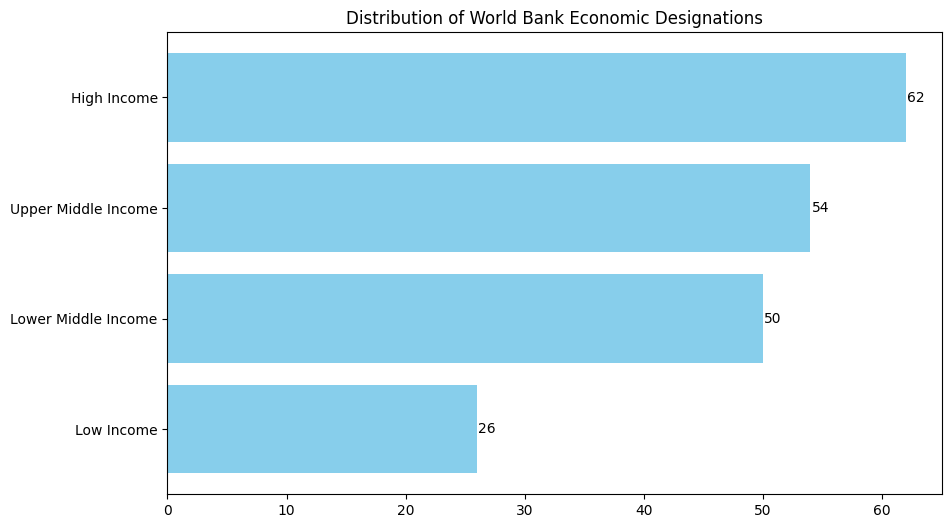

In [ ]:
eda_dict = {'Low Income': 26,'Lower Middle Income': 50, 'Upper Middle Income': 54, 'High Income':62 }

# Extract keys and values from the dictionary
econ_status = list(eda_dict.keys())
status_count = list(eda_dict.values())

plt.figure(figsize=(10, 6))
bars = plt.barh(econ_status, status_count, color='skyblue')

# Add labels at the end of each bar
for bar in bars:
    plt.text(
        bar.get_width() + 0.1,  # X position, slightly offset from the bar
        bar.get_y() + bar.get_height() / 2,  # Y position at the center of the bar
        f'{int(bar.get_width())}',  # The label with the value
        va='center'
    )

# Add titles and labels
plt.xlabel('')
plt.ylabel('')
plt.title('Distribution of World Bank Economic Designations')

# Show the plot
plt.show()

#Data Cleaning

In [ ]:
#clean gdp per capita data

#remove countries without world bank classification
econ_df = econ_df.dropna(subset=['WB_class'])

#remove countries without life expectancy data by crosschecking with life_expect_df
no_le_data_countries = econ_df[~econ_df['country'].isin(life_expect_df['country'])]['country'].tolist() #creates list just for record keeping
econ_df = econ_df[econ_df['country'].isin(life_expect_df['country'])]

#remove fields with data from years outside of 1900-2000
econ_df = econ_df[[col for col in econ_df.columns if not (col.isdigit() and (int(col) < 1900 or int(col) > 2000))]]

#rewrite gdp values as full numbers (ie 1k -> 1000)

year_columns = [col for col in econ_df.columns if col.isdigit()]

for col in year_columns:
    # Use a lambda function to check if a value ends with 'k', multiply by 1000 if true, and convert to float
    econ_df[col] = econ_df[col].apply(lambda x: float(x[:-1]) * 1000 if isinstance(x, str) and x.endswith('k') else x)

# Convert the entire column to numeric type, replacing non-convertible values with NaN
econ_df[year_columns] = econ_df[year_columns].apply(pd.to_numeric, errors='coerce')

econ_df.head(10)

,country,WB_class,1900,1901,1902,1903,1904,1905,1906,1907,...,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000
0,Afghanistan,LI,692,701,710,719.0,728,737.0,746.0,756.0,...,1290.0,1240.0,854.0,636.0,944.0,900.0,860.0,825.0,789.0,768.0
1,Angola,LMI,574,576,579,582.0,584,586.0,589.0,592.0,...,4040.0,3800.0,2890.0,2920.0,3340.0,3760.0,4000.0,4140.0,4190.0,4260.0
2,Albania,UMI,620,622,624,625.0,627,629.0,631.0,633.0,...,3450.0,3260.0,3590.0,3910.0,4400.0,4830.0,4320.0,4740.0,5400.0,5830.0
3,Andorra,HI,3630,3670,3720,3760.0,3800,3850.0,3900.0,3940.0,...,39900.0,39000.0,37400.0,37400.0,37900.0,39600.0,43500.0,45300.0,47200.0,47000.0
5,Argentina,UMI,5200,5210,4920,5420.0,5780,6300.0,6370.0,6260.0,...,14500.0,15600.0,16600.0,17400.0,16700.0,17500.0,18800.0,19300.0,18500.0,18200.0
6,Armenia,UMI,1580,1620,1770,1650.0,1830,1620.0,1550.0,1500.0,...,5450.0,3160.0,2900.0,3090.0,3320.0,3480.0,3570.0,3810.0,3920.0,4150.0
7,Antigua and Barbuda,HI,1480,1490,1500,1510.0,1520,1530.0,1540.0,1550.0,...,16600.0,16500.0,17000.0,17700.0,16500.0,17200.0,17700.0,18100.0,18400.0,19200.0
8,Australia,HI,7270,6950,6920,7380.0,7770,7750.0,8160.0,8360.0,...,30500.0,30500.0,31500.0,32600.0,33400.0,34300.0,35300.0,36600.0,37900.0,38900.0
9,Austria,HI,5220,5180,5330,5320.0,5350,5590.0,5750.0,6040.0,...,36400.0,36900.0,36900.0,37800.0,38900.0,39900.0,40800.0,42300.0,43900.0,45400.0
10,Azerbaijan,UMI,1410,1450,1570,1460.0,1610,1430.0,1360.0,1310.0,...,7690.0,5870.0,4450.0,3520.0,3060.0,3080.0,3240.0,3510.0,3750.0,4100.0


In [ ]:
#clean life expectancy data

#remove fields with data from years outside of 1900-2000
life_expect_df = life_expect_df[[col for col in life_expect_df.columns if not (col.isdigit() and (int(col) < 1900 or int(col) > 2000))]]

#remove countries without World Bank Classification by crosschecking with econ_df
no_econ_data_countries = life_expect_df[~life_expect_df['country'].isin(econ_df['country'])]['country'].tolist() #creates list just for record keeping
life_expect_df = life_expect_df[life_expect_df['country'].isin(econ_df['country'])]


life_expect_df.head(10)

,country,1900,1901,1902,1903,1904,1905,1906,1907,1908,...,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000
0,Afghanistan,35.2,35.4,35.5,35.7,35.8,36.0,36.1,36.2,36.4,...,53.8,54.2,54.4,53.9,54.3,54.7,54.5,53.3,54.7,54.7
1,Angola,33.5,33.6,33.8,33.9,34.0,34.2,34.3,34.4,34.6,...,50.3,50.3,49.0,50.3,51.2,51.7,51.6,50.6,51.9,52.8
2,Albania,34.7,34.6,34.6,34.6,34.6,34.6,34.6,34.6,34.5,...,72.6,73.2,73.8,74.6,74.6,74.5,72.9,74.8,75.1,75.4
3,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,79.1,79.2,79.3,79.5,79.8,80.0,80.2,80.4,80.6,80.8
5,Argentina,37.3,37.9,38.5,39.1,39.7,40.3,41.1,41.9,42.6,...,72.7,72.8,73.0,73.4,73.4,73.5,73.6,73.7,73.8,74.2
6,Armenia,31.8,32.0,32.1,32.2,32.4,32.5,32.6,32.8,32.9,...,70.3,69.4,69.0,69.5,70.1,70.4,71.1,71.6,71.9,72.4
7,Antigua and Barbuda,33.6,33.6,33.6,33.6,33.6,33.6,33.6,33.6,33.6,...,74.0,74.0,73.4,73.3,73.3,74.0,73.5,74.5,74.7,74.8
8,Australia,50.1,50.6,51.1,51.7,52.2,52.7,53.3,53.8,54.3,...,77.4,77.6,77.9,78.0,78.3,78.5,78.8,79.1,79.4,79.7
9,Austria,41.5,42.0,41.0,40.1,40.7,41.3,42.0,42.6,43.2,...,76.1,76.3,76.5,76.7,77.0,77.3,77.7,77.9,78.2,78.5
10,Azerbaijan,25.8,25.9,26.0,26.1,26.2,26.3,26.4,26.4,26.5,...,66.3,64.5,64.3,63.8,64.7,65.3,65.7,66.0,66.2,66.5


#EDA Cont.

In [ ]:
#count how many countries have NaN data between 1900-2000 for GDP per cap

econ_NaN_count = econ_df.isna().any(axis=1).sum()

print(econ_NaN_count)

0


In [ ]:
#count how many countries have NaN data between 1900-2000 for life expectancy data

le_NaN_count = econ_df.isna().any(axis=1).sum()

print(econ_NaN_count)

0


# MI3 Analysis

In [ ]:
#Transpose the life expectancy df


#life_expect_df = life_expect_df.set_index('country')  # Set 'Country' as the index


# Step 1: Transpose the dataframe to switch rows and columns
#life_expect_df = life_expect_df.T  # Now, years are rows and countries are columns

# Step 2: Rename the index to 'year_id'
#life_expect_df= life_expect_df.rename_axis('year_id').reset_index()

#life_expect_df.head(10)



In [ ]:

# Transpose the econ df


#econ_df = econ_df.drop(columns=['WB_class'])

#econ_df = econ_df.set_index('country')  # Set 'Country' as the index


# Step 1: Transpose the dataframe to switch rows and columns
#econ_df = econ_df.T  # Now, years are rows and countries are columns

# Step 2: Rename the index to 'year_id'
#econ_df= econ_df.rename_axis('year_id').reset_index()

#econ_df.head(10)




In [ ]:
life_expect_df.head(10)

,country,1900,1901,1902,1903,1904,1905,1906,1907,1908,...,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000
0,Afghanistan,35.2,35.4,35.5,35.7,35.8,36.0,36.1,36.2,36.4,...,53.8,54.2,54.4,53.9,54.3,54.7,54.5,53.3,54.7,54.7
1,Angola,33.5,33.6,33.8,33.9,34.0,34.2,34.3,34.4,34.6,...,50.3,50.3,49.0,50.3,51.2,51.7,51.6,50.6,51.9,52.8
2,Albania,34.7,34.6,34.6,34.6,34.6,34.6,34.6,34.6,34.5,...,72.6,73.2,73.8,74.6,74.6,74.5,72.9,74.8,75.1,75.4
3,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,79.1,79.2,79.3,79.5,79.8,80.0,80.2,80.4,80.6,80.8
5,Argentina,37.3,37.9,38.5,39.1,39.7,40.3,41.1,41.9,42.6,...,72.7,72.8,73.0,73.4,73.4,73.5,73.6,73.7,73.8,74.2
6,Armenia,31.8,32.0,32.1,32.2,32.4,32.5,32.6,32.8,32.9,...,70.3,69.4,69.0,69.5,70.1,70.4,71.1,71.6,71.9,72.4
7,Antigua and Barbuda,33.6,33.6,33.6,33.6,33.6,33.6,33.6,33.6,33.6,...,74.0,74.0,73.4,73.3,73.3,74.0,73.5,74.5,74.7,74.8
8,Australia,50.1,50.6,51.1,51.7,52.2,52.7,53.3,53.8,54.3,...,77.4,77.6,77.9,78.0,78.3,78.5,78.8,79.1,79.4,79.7
9,Austria,41.5,42.0,41.0,40.1,40.7,41.3,42.0,42.6,43.2,...,76.1,76.3,76.5,76.7,77.0,77.3,77.7,77.9,78.2,78.5
10,Azerbaijan,25.8,25.9,26.0,26.1,26.2,26.3,26.4,26.4,26.5,...,66.3,64.5,64.3,63.8,64.7,65.3,65.7,66.0,66.2,66.5


In [ ]:
econ_df = econ_df.drop('WB_class', axis=1)
econ_df.head(10)

,country,1900,1901,1902,1903,1904,1905,1906,1907,1908,...,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000
0,Afghanistan,692,701,710,719.0,728,737.0,746.0,756.0,765.0,...,1290.0,1240.0,854.0,636.0,944.0,900.0,860.0,825.0,789.0,768.0
1,Angola,574,576,579,582.0,584,586.0,589.0,592.0,594.0,...,4040.0,3800.0,2890.0,2920.0,3340.0,3760.0,4000.0,4140.0,4190.0,4260.0
2,Albania,620,622,624,625.0,627,629.0,631.0,633.0,634.0,...,3450.0,3260.0,3590.0,3910.0,4400.0,4830.0,4320.0,4740.0,5400.0,5830.0
3,Andorra,3630,3670,3720,3760.0,3800,3850.0,3900.0,3940.0,3990.0,...,39900.0,39000.0,37400.0,37400.0,37900.0,39600.0,43500.0,45300.0,47200.0,47000.0
5,Argentina,5200,5210,4920,5420.0,5780,6300.0,6370.0,6260.0,6620.0,...,14500.0,15600.0,16600.0,17400.0,16700.0,17500.0,18800.0,19300.0,18500.0,18200.0
6,Armenia,1580,1620,1770,1650.0,1830,1620.0,1550.0,1500.0,1640.0,...,5450.0,3160.0,2900.0,3090.0,3320.0,3480.0,3570.0,3810.0,3920.0,4150.0
7,Antigua and Barbuda,1480,1490,1500,1510.0,1520,1530.0,1540.0,1550.0,1560.0,...,16600.0,16500.0,17000.0,17700.0,16500.0,17200.0,17700.0,18100.0,18400.0,19200.0
8,Australia,7270,6950,6920,7380.0,7770,7750.0,8160.0,8360.0,8500.0,...,30500.0,30500.0,31500.0,32600.0,33400.0,34300.0,35300.0,36600.0,37900.0,38900.0
9,Austria,5220,5180,5330,5320.0,5350,5590.0,5750.0,6040.0,6010.0,...,36400.0,36900.0,36900.0,37800.0,38900.0,39900.0,40800.0,42300.0,43900.0,45400.0
10,Azerbaijan,1410,1450,1570,1460.0,1610,1430.0,1360.0,1310.0,1430.0,...,7690.0,5870.0,4450.0,3520.0,3060.0,3080.0,3240.0,3510.0,3750.0,4100.0


In [ ]:
merged_df = pd.merge(econ_df, life_expect_df, on='country', suffixes=('_GDP', '_LifeExp'))


In [ ]:
merged_df.head(10)

,country,1900_GDP,1901_GDP,1902_GDP,1903_GDP,1904_GDP,1905_GDP,1906_GDP,1907_GDP,1908_GDP,...,1991_LifeExp,1992_LifeExp,1993_LifeExp,1994_LifeExp,1995_LifeExp,1996_LifeExp,1997_LifeExp,1998_LifeExp,1999_LifeExp,2000_LifeExp
0,Afghanistan,692,701,710,719.0,728,737.0,746.0,756.0,765.0,...,53.8,54.2,54.4,53.9,54.3,54.7,54.5,53.3,54.7,54.7
1,Angola,574,576,579,582.0,584,586.0,589.0,592.0,594.0,...,50.3,50.3,49.0,50.3,51.2,51.7,51.6,50.6,51.9,52.8
2,Albania,620,622,624,625.0,627,629.0,631.0,633.0,634.0,...,72.6,73.2,73.8,74.6,74.6,74.5,72.9,74.8,75.1,75.4
3,Andorra,3630,3670,3720,3760.0,3800,3850.0,3900.0,3940.0,3990.0,...,79.1,79.2,79.3,79.5,79.8,80.0,80.2,80.4,80.6,80.8
4,Argentina,5200,5210,4920,5420.0,5780,6300.0,6370.0,6260.0,6620.0,...,72.7,72.8,73.0,73.4,73.4,73.5,73.6,73.7,73.8,74.2
5,Armenia,1580,1620,1770,1650.0,1830,1620.0,1550.0,1500.0,1640.0,...,70.3,69.4,69.0,69.5,70.1,70.4,71.1,71.6,71.9,72.4
6,Antigua and Barbuda,1480,1490,1500,1510.0,1520,1530.0,1540.0,1550.0,1560.0,...,74.0,74.0,73.4,73.3,73.3,74.0,73.5,74.5,74.7,74.8
7,Australia,7270,6950,6920,7380.0,7770,7750.0,8160.0,8360.0,8500.0,...,77.4,77.6,77.9,78.0,78.3,78.5,78.8,79.1,79.4,79.7
8,Austria,5220,5180,5330,5320.0,5350,5590.0,5750.0,6040.0,6010.0,...,76.1,76.3,76.5,76.7,77.0,77.3,77.7,77.9,78.2,78.5
9,Azerbaijan,1410,1450,1570,1460.0,1610,1430.0,1360.0,1310.0,1430.0,...,66.3,64.5,64.3,63.8,64.7,65.3,65.7,66.0,66.2,66.5


In [ ]:
import pandas as pd
import numpy as np

# Assuming merged_df is your DataFrame with correct country names
# Convert relevant columns to numeric, coercing any non-numeric values to NaN
merged_df.iloc[:, 1:] = merged_df.iloc[:, 1:].apply(pd.to_numeric, errors='coerce')

# Get the GDP and life expectancy columns
gdp_columns = [col for col in merged_df.columns if col.endswith('_GDP')]
life_exp_columns = [col for col in merged_df.columns if col.endswith('_LifeExp')]

# Initialize a list to store correlation results
correlation_results = []

# Iterate over each country in the merged DataFrame
for index, row in merged_df.iterrows():
    # Extract GDP and life expectancy values based on the identified columns
    gdp_values = row[gdp_columns].dropna().values
    life_exp_values = row[life_exp_columns].dropna().values

    # Check lengths after dropping NaNs
    if len(gdp_values) == 0 or len(life_exp_values) == 0:
        correlation_results.append({'country': row['country'], 'Correlation': None})
        continue

    # Only calculate correlation if both arrays have enough values
    if len(gdp_values) > 1 and len(life_exp_values) > 1:
        correlation = pd.Series(gdp_values).corr(pd.Series(life_exp_values))
        correlation_results.append({'country': row['country'], 'Correlation': correlation})
    else:
        correlation_results.append({'country': row['country'], 'Correlation': None})  # Handle cases with insufficient data

# Create a DataFrame from the results list
correlation_results_df = pd.DataFrame(correlation_results)

# Display the results
print(correlation_results_df)


          country  Correlation
0     Afghanistan     0.355045
1          Angola     0.856345
2         Albania     0.956376
3         Andorra     0.980467
4       Argentina     0.864444
..            ...          ...
187         Samoa     0.947125
188         Yemen     0.974262
189  South Africa     0.927720
190        Zambia     0.929531
191      Zimbabwe     0.834781

[192 rows x 2 columns]


In [ ]:
correlation_results_df.head(100)

,country,Correlation
0,Afghanistan,0.355045
1,Angola,0.856345
2,Albania,0.956376
3,Andorra,0.980467
4,Argentina,0.864444
...,...,...
95,Lao,0.827325
96,Lebanon,0.906856
97,Liberia,0.471713
98,Libya,0.925864


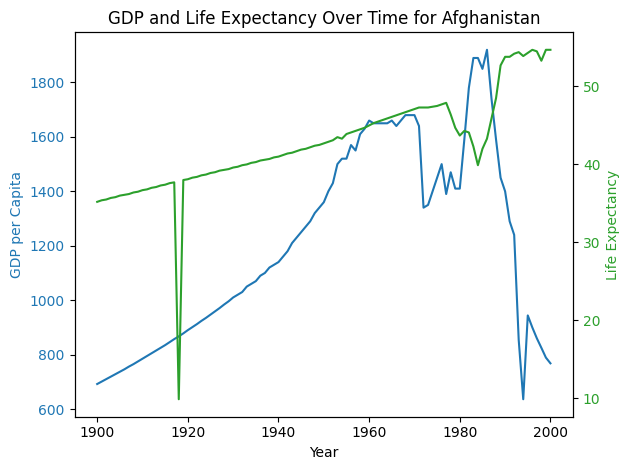

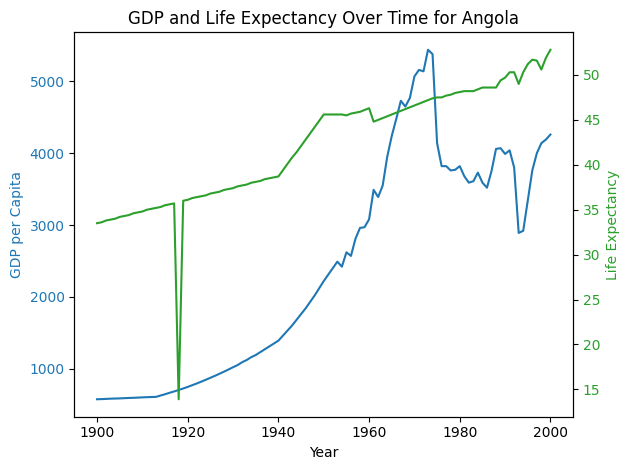

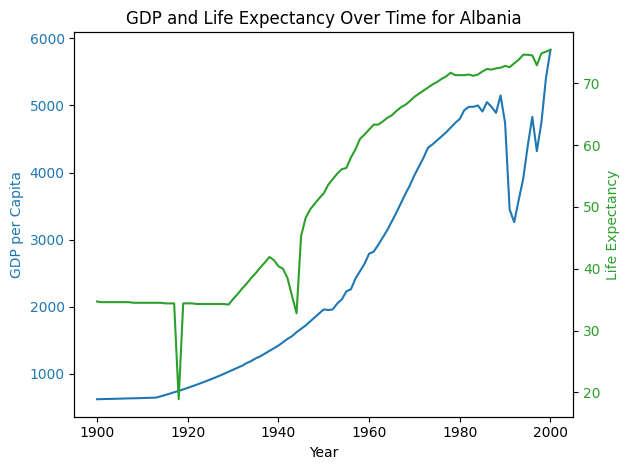

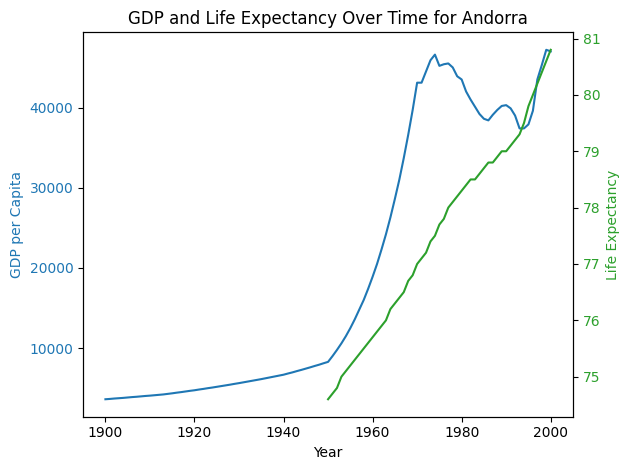

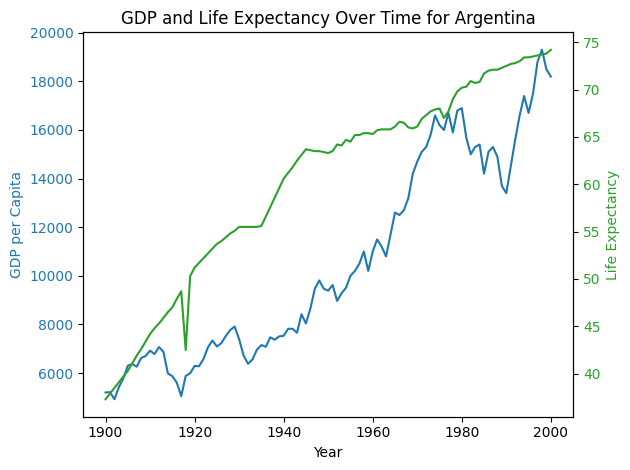

...

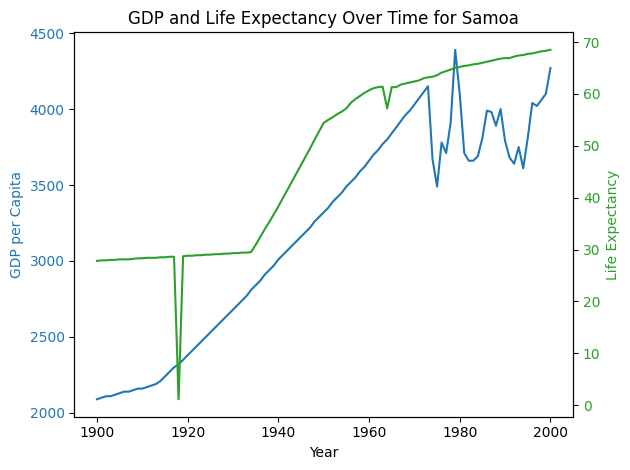

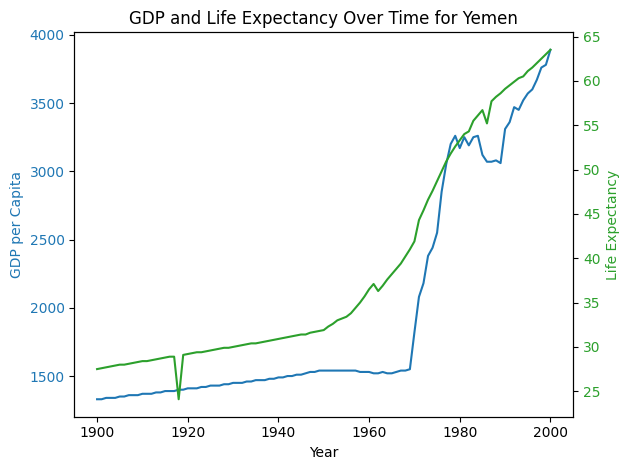

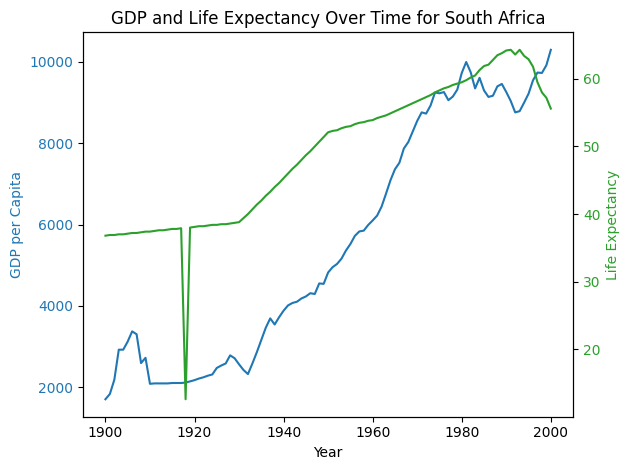

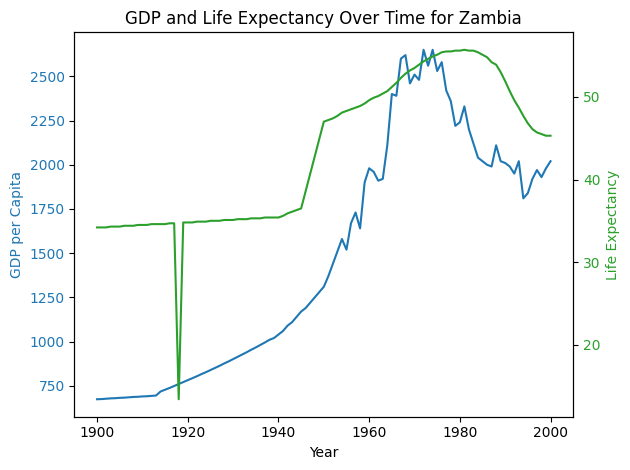

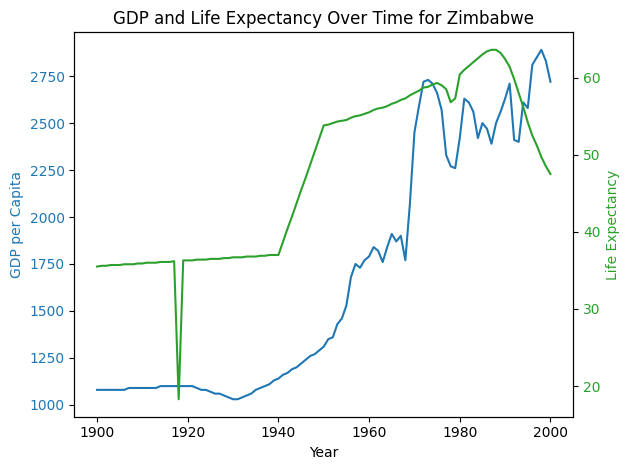

In [ ]:
# dual axis plot for each country

# Iterate over each country
for country in merged_df['country'].unique():
    # Filter data for the current country
    country_data = merged_df[merged_df['country'] == country]

    # Extract GDP and Life Expectancy data
    gdp_data = country_data[gdp_columns].values.flatten()
    life_exp_data = country_data[life_exp_columns].values.flatten()

    # Create a time series index (assuming columns are years)
    years = [int(col.split('_')[0]) for col in gdp_columns]

    # Plotting
    fig, ax1 = plt.subplots()

    # Plot GDP on the primary y-axis
    ax1.set_xlabel('Year')
    ax1.set_ylabel('GDP per Capita', color='tab:blue')
    ax1.plot(years, gdp_data, color='tab:blue', label='GDP per Capita')
    ax1.tick_params(axis='y', labelcolor='tab:blue')

    # Create a secondary y-axis for Life Expectancy
    ax2 = ax1.twinx()
    ax2.set_ylabel('Life Expectancy', color='tab:green')
    ax2.plot(years, life_exp_data, color='tab:green', label='Life Expectancy')
    ax2.tick_params(axis='y', labelcolor='tab:green')

    # Add title and show plot
    plt.title(f'GDP and Life Expectancy Over Time for {country}')
    fig.tight_layout()
    plt.show()

In [ ]:
# Summary Statistics and Plots for Economic Designation

# Merge with wb_class_df to add WB_class to merged dataset
merged_with_class = pd.merge(merged_df, wb_class_df, on='country')

# Calculate average GDP and Life Expectancy by World Bank classification
gdp_columns = [col for col in merged_with_class.columns if col.endswith('_GDP')]
life_exp_columns = [col for col in merged_with_class.columns if col.endswith('_LifeExp')]

# Calculate mean for each classification
avg_gdp_lifeexp_by_classification = merged_with_class.groupby('WB_class')[
    gdp_columns + life_exp_columns].mean().reset_index()

avg_gdp_lifeexp_by_classification.head(10)

,WB_class,1900_GDP,1901_GDP,1902_GDP,1903_GDP,1904_GDP,1905_GDP,1906_GDP,1907_GDP,1908_GDP,...,1991_LifeExp,1992_LifeExp,1993_LifeExp,1994_LifeExp,1995_LifeExp,1996_LifeExp,1997_LifeExp,1998_LifeExp,1999_LifeExp,2000_LifeExp
0,HI,3286.016129,3328.564516,3393.193548,3419.677419,3461.209677,3489.274194,3591.306452,3632.112903,3637.209677,...,73.609677,73.846774,73.858065,73.958065,74.133871,74.443548,74.656452,74.859677,75.059677,75.370968
1,LI,841.538462,845.307692,849.423077,852.461538,856.192308,859.923077,863.730769,867.846154,871.230769,...,53.292308,53.619231,53.653846,51.992308,53.273077,53.361538,53.450000,53.603846,53.742308,54.511538
2,LMI,1074.860000,1078.740000,1090.600000,1098.140000,1102.700000,1099.460000,1106.140000,1107.740000,1119.540000,...,61.370000,61.394000,61.310000,61.428000,61.384000,61.440000,61.378000,61.324000,61.598000,61.838000
3,UMI,1572.203704,1591.425926,1619.703704,1643.425926,1684.222222,1687.555556,1691.740741,1698.592593,1717.000000,...,68.870370,68.812963,68.814815,68.896296,68.940741,69.188889,69.337037,69.492593,69.555556,69.724074


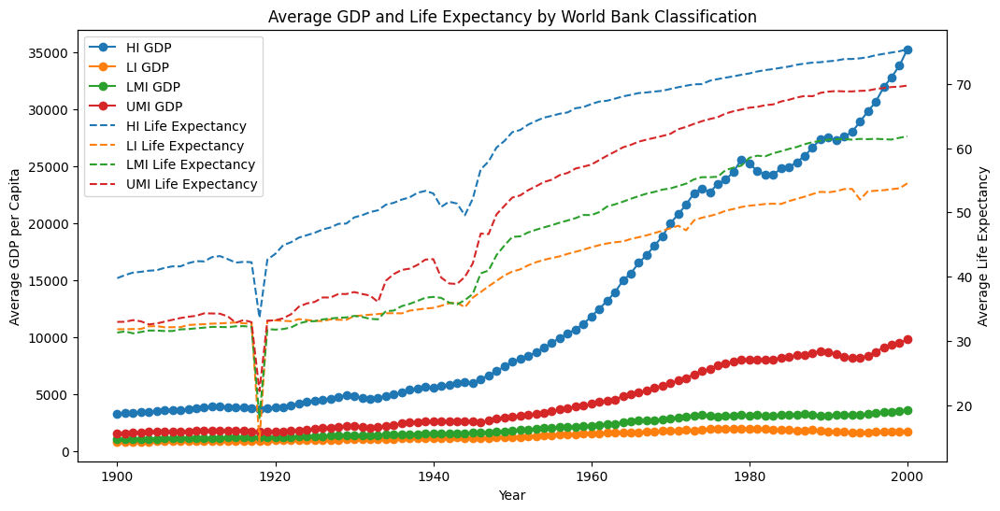

In [ ]:
# Melt the DataFrame to long format for easier plotting
melted_gdp = avg_gdp_lifeexp_by_classification.melt(id_vars='WB_class',
                                                    value_vars=[col for col in avg_gdp_lifeexp_by_classification.columns if col.endswith('_GDP')],
                                                    var_name='Year', value_name='Avg_GDP')

melted_life_exp = avg_gdp_lifeexp_by_classification.melt(id_vars='WB_class',
                                                         value_vars=[col for col in avg_gdp_lifeexp_by_classification.columns if col.endswith('_LifeExp')],
                                                         var_name='Year', value_name='Avg_LifeExp')

# Extract year from column names
melted_gdp['Year'] = melted_gdp['Year'].str.extract('(\d+)').astype(int)
melted_life_exp['Year'] = melted_life_exp['Year'].str.extract('(\d+)').astype(int)

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot GDP data
for wb_class in melted_gdp['WB_class'].unique():
    subset = melted_gdp[melted_gdp['WB_class'] == wb_class]
    ax1.plot(subset['Year'], subset['Avg_GDP'], marker='o', label=f'{wb_class} GDP')

ax1.set_xlabel('Year')
ax1.set_ylabel('Average GDP per Capita')
ax1.set_title('Average GDP and Life Expectancy by World Bank Classification')

# Create a second y-axis for life expectancy
ax2 = ax1.twinx()
for wb_class in melted_life_exp['WB_class'].unique():
    subset = melted_life_exp[melted_life_exp['WB_class'] == wb_class]
    ax2.plot(subset['Year'], subset['Avg_LifeExp'], linestyle='--', label=f'{wb_class} Life Expectancy')

ax2.set_ylabel('Average Life Expectancy')

# Combine legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

plt.show()